# 🛰️ Analisis Komparasi Menyeluruh Curah Hujan Satelit & Reanalisis Harian (2004 – 2025)
### Matriks Evaluasi Antar-Variabel (*All-to-All Pairwise Inter-Comparison*) & Benchmark CHIRPS Reanalisis (Kebumen dan Sekitarnya)

Notebook ini menyajikan analisis komparasi multi-model yang **jujur, transparan, dan tidak bias** terhadap **9 variabel data curah hujan** selama **22 tahun (2004 – 2025)** dengan total **8.036 rekaman harian** dari dataset `Data_Curah_Hujan_Kebumen_2004_2025.csv`. Pendekatan yang digunakan:
1. **Evaluasi Matriks Inter-Model All-to-All ($9 \times 9 = 36$ pasangan unik)**: Membandingkan setiap variabel terhadap setiap variabel lainnya untuk melihat konsensus model (*ensemble agreement*) dan sebaran ketidakpastian (*uncertainty spread*).
2. **Benchmark Utama Kontinu CHIRPS Reanalisis (`CHIRPS_RNL`)**: Memiliki data **100% lengkap 8.036 hari (0% missing)** yang mengasimilasi data satelit infra-merah termal, model reanalisis atmosfer global, dan kalibrasi interpolasi stasiun darat global.
3. **Validasi Stasiun Darat Pos Hujan Oya (`OYA`)**: Sebagai benchmark observasi lapangan untuk 7.228 hari pengamatan valid.
4. **9 Produk Presipitasi yang Dievaluasi**:
   - `CHIRPS_RNL`: CHIRPS Reanalisis Blended
   - `CHIRPS_SAT`: CHIRPS Satelit Murni
   - `CHIRPS_FNL`: CHIRPS Final (*Gauge-calibrated Final Product*) ⭐ **[BARU]**
   - `GSMaP`: JAXA Global Satellite Mapping of Precipitation
   - `IMERG`: NASA GPM IMERG Final V06/V07
   - `PERSIANN`: NOAA/CHRS PERSIANN-CDR (*Climate Data Record*)
   - `ERA5`: ECMWF Reanalisis Atmosfer Global
   - `ERA5_LAND`: ECMWF ERA5-Land Reanalisis Permukaan Daratan
   - `OYA`: Pos Observasi Lapangan Curah Hujan Oya, Kebumen
5. **Metrik Evaluasi Komprehensif**: Pearson $r$, Spearman $\rho$, $R^2$, RMSE, MAE, Bias, PBIAS, Nash-Sutcliffe Efficiency (NSE), Kling-Gupta Efficiency (KGE), serta skor kontingensi (POD, FAR, CSI, FBI, HSS, ETS) pada berbagai ambang batas hujan ($0.1 - 50.0\text{ mm/hari}$).
6. **Uji Signifikansi Statistik Non-Parametrik**: Uji Wilcoxon Signed-Rank (*Paired*) untuk semua 36 pasangan data dan Uji Mann-Whitney U (*Musim Hujan vs Musim Kemarau*).


In [1]:
import os
import sys
import warnings
import numpy as np
import pandas as pd
import scipy.stats as stats
from scipy.stats import wilcoxon, mannwhitneyu
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
from IPython.display import display, Markdown, HTML

if hasattr(sys.stdout, "reconfigure"):
    sys.stdout.reconfigure(encoding="utf-8")

warnings.filterwarnings('ignore')
plt.rcParams['figure.dpi'] = 300
sns.set_theme(style='whitegrid')

# Setup direktori
base_dir = os.path.dirname(os.path.abspath(__file__)) if '__file__' in globals() else os.path.abspath('Google_Earth_Engine') if os.path.exists('Google_Earth_Engine') else os.getcwd()
data_csv = os.path.join(base_dir, 'Data_Satelit', 'Data_Curah_Hujan_Kebumen_2004_2025.csv')
if not os.path.exists(data_csv):
    alt_csv = os.path.join(base_dir, 'Data_Satelit', 'Data_Curah_Hujan_Satelit_2004_2025.csv')
    if os.path.exists(alt_csv):
        data_csv = alt_csv

out_dir = os.path.join(base_dir, 'Hasil_Analisis_Harian_2004_2025')
os.makedirs(out_dir, exist_ok=True)

display(Markdown(f"** Direktori Basis:** `{base_dir}`\n\n** File Data:** `{data_csv}`\n\n** Folder Output:** `{out_dir}`"))


** Direktori Basis:** `d:\Github\Projek_Rainfall\Google_Earth_Engine`

** File Data:** `d:\Github\Projek_Rainfall\Google_Earth_Engine\Data_Satelit\Data_Curah_Hujan_Kebumen_2004_2025.csv`

** Folder Output:** `d:\Github\Projek_Rainfall\Google_Earth_Engine\Hasil_Analisis_Harian_2004_2025`

## 1. Pemuatan Data, Standarisasi Waktu & Audit Integritas (9 Variabel)
Data memuat 9 seri waktu curah hujan harian (total 11 kolom termasuk identifier waktu):
- `CHIRPS_RNL`: CHIRPS Reanalisis (*Blended Gauge-Satellite Reanalysis*, 0% missing, acuan kontinu)
- `CHIRPS_SAT`: CHIRPS Satelit Murni (*Uncalibrated*)
- `CHIRPS_FNL`: CHIRPS Final (*Gauge-calibrated Final Product*) ⭐ **[BARU]**
- `GSMaP`: JAXA Global Satellite Mapping of Precipitation
- `IMERG`: NASA GPM IMERG Final V06/V07
- `PERSIANN`: NOAA/CHRS PERSIANN-CDR (*Climate Data Record*)
- `ERA5`: ECMWF Reanalisis Atmosfer Global
- `ERA5_LAND`: ECMWF ERA5-Land Reanalisis Permukaan Daratan
- `OYA`: Observasi Lapangan Stasiun Pos Hujan Oya (*Ground Truth Benchmark*)


In [2]:
# Load dataset
df_raw = pd.read_csv(data_csv)

# Standarisasi waktu
if 'datetime_utc' in df_raw.columns:
    df_raw['datetime'] = pd.to_datetime(df_raw['datetime_utc'], utc=True)
elif 'unixtime' in df_raw.columns:
    df_raw['datetime'] = pd.to_datetime(df_raw['unixtime'], unit='ms' if df_raw['unixtime'].max() > 1e11 else 's', utc=True)

df = df_raw.sort_values('datetime').set_index('datetime')
sat_cols = ['CHIRPS_RNL', 'CHIRPS_SAT', 'CHIRPS_FNL', 'GSMaP', 'IMERG', 'PERSIANN', 'ERA5', 'ERA5_LAND', 'OYA']
avail_cols = [c for c in sat_cols if c in df.columns]
df_eval = df[avail_cols].copy()

# Audit data
missing = df_eval.isna().sum()
negatives = (df_eval < 0).sum()
dry_days = ((df_eval < 0.1).sum() / len(df_eval) * 100.0).round(2)

audit_df = pd.DataFrame({
    'Total Rekaman': len(df_eval),
    'Missing (NaN)': missing,
    'Persentase Missing (%)': (missing / len(df_eval) * 100.0).round(2),
    'Hari Tanpa Hujan (< 0.1 mm) %': dry_days,
    'Nilai Negatif (< 0)': negatives
})

display(Markdown("### 📋 Tabel Audit Integritas Dataset (9 Variabel)"))
display(audit_df)

# Statistik deskriptif
desc_df = df_eval.describe().T[['count', 'mean', 'std', 'min', '25%', '50%', '75%', 'max']]
desc_df['skewness'] = df_eval.skew().round(3)
desc_df['kurtosis'] = df_eval.kurtosis().round(3)

display(Markdown("### 📊 Ringkasan Statistik Deskriptif Harian (mm/hari)"))
display(desc_df.round(3))


### 📋 Tabel Audit Integritas Dataset (9 Variabel)

,Total Rekaman,Missing (NaN),Persentase Missing (%),Hari Tanpa Hujan (< 0.1 mm) %,Nilai Negatif (< 0)
CHIRPS_RNL,8036,0,0.00,11.71,0
CHIRPS_SAT,8036,0,0.00,25.73,0
CHIRPS_FNL,8036,0,0.00,49.79,0
GSMaP,8036,0,0.00,41.87,0
IMERG,8036,0,0.00,35.02,0
PERSIANN,8036,4,0.05,34.54,0
ERA5,8036,0,0.00,7.02,18
ERA5_LAND,8036,0,0.00,5.85,0
OYA,8036,808,10.05,44.77,0


### 📊 Ringkasan Statistik Deskriptif Harian (mm/hari)

,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis
CHIRPS_RNL,8036.0,7.448,9.792,0.0,0.746,3.697,10.485,86.540,2.406,8.096
CHIRPS_SAT,8036.0,7.448,12.019,0.0,0.074,1.856,9.996,132.777,2.736,10.639
CHIRPS_FNL,8036.0,9.195,12.734,0.0,0.000,0.597,15.576,116.143,1.837,4.784
GSMaP,8036.0,7.169,12.407,0.0,0.000,1.424,9.585,151.108,3.223,16.639
IMERG,8036.0,8.477,16.110,0.0,0.000,1.285,9.957,199.315,3.625,19.290
PERSIANN,8032.0,7.421,9.394,0.0,0.000,3.493,12.366,74.785,1.599,2.943
ERA5,8036.0,7.100,11.336,-0.0,0.986,3.376,9.117,165.699,5.210,44.467
ERA5_LAND,8036.0,7.129,11.463,0.0,1.002,3.360,9.034,184.221,5.386,47.797
OYA,7228.0,5.052,10.068,0.0,0.000,0.170,5.645,117.328,3.475,16.819


## 2. Scatter Plot Matrix Pairwise All-to-All ($9 \times 9 = 81$ Subplot)
Menampilkan seluruh matriks perbandingan pasangan variabel secara menyeluruh dilengkapi dengan garis regresi OLS (merah), garis referensi 1:1 identik (hitam putus-putus), koefisien korelasi Pearson $r$, dan Spearman $\rho$.


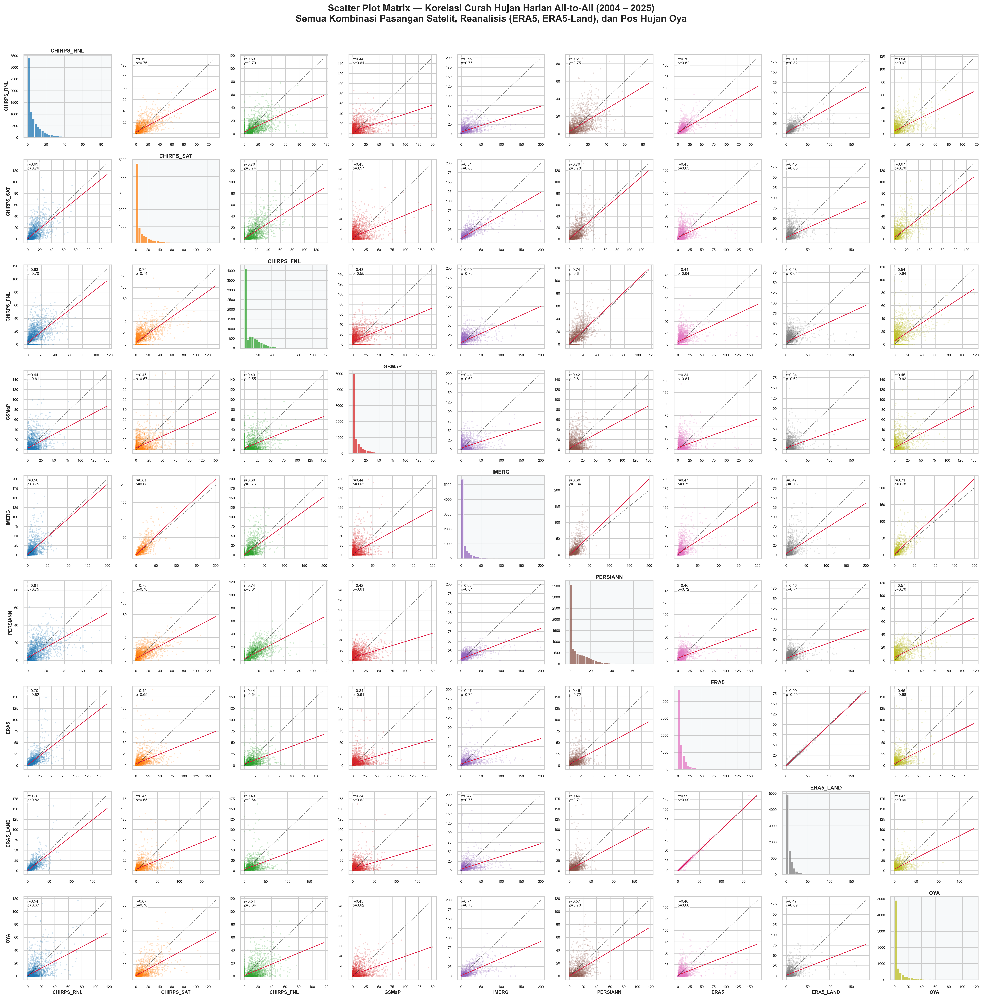

In [3]:
n_cols = len(avail_cols)
fig_size = 2.6 * n_cols
fig, axes = plt.subplots(n_cols, n_cols, figsize=(fig_size, fig_size), squeeze=False)
fig.suptitle('Scatter Plot Matrix — Korelasi Curah Hujan Harian All-to-All (2004 – 2025)\nSemua Kombinasi Pasangan Satelit, Reanalisis (ERA5, ERA5-Land), dan Pos Hujan Oya',
             fontsize=16, fontweight='bold', y=1.01)

COLORS = plt.cm.tab10.colors

for i, col_y in enumerate(avail_cols):
    for j, col_x in enumerate(avail_cols):
        ax = axes[i][j]
        if i == j:
            data_diag = df_eval[col_y].dropna()
            ax.hist(data_diag, bins=35, color=COLORS[i % len(COLORS)], alpha=0.75, edgecolor='white', linewidth=0.5)
            ax.set_facecolor('#f7f9fa')
            ax.set_title(col_y, fontsize=9.0, fontweight='bold', pad=3)
            ax.set_xlabel('mm/hari', fontsize=6.5)
            ax.set_ylabel('Freq', fontsize=6.5)
            ax.tick_params(labelsize=6.0)
        else:
            mask = df_eval[col_x].notna() & df_eval[col_y].notna()
            x_data = df_eval.loc[mask, col_x]
            y_data = df_eval.loc[mask, col_y]
            
            if len(x_data) < 5:
                ax.text(0.5, 0.5, 'N/A', transform=ax.transAxes, ha='center', va='center', fontsize=8, color='gray')
                continue
                
            r_p, _ = stats.pearsonr(x_data, y_data)
            r_s, _ = stats.spearmanr(x_data, y_data)
            
            n_plot = min(len(x_data), 2500)
            idx_samp = np.random.choice(len(x_data), n_plot, replace=False) if len(x_data) > n_plot else np.arange(len(x_data))
            ax.scatter(x_data.iloc[idx_samp], y_data.iloc[idx_samp], alpha=0.20, s=5, color=COLORS[j % len(COLORS)], edgecolors='none')
            
            joint_min = 0
            joint_max = max(x_data.max(), y_data.max())
            ax.plot([joint_min, joint_max], [joint_min, joint_max], 'k--', linewidth=0.8, alpha=0.6)
            
            slope, intercept, _, _, _ = stats.linregress(x_data, y_data)
            x_line = np.linspace(joint_min, joint_max, 50)
            ax.plot(x_line, slope * x_line + intercept, color='crimson', linewidth=1.0)
            
            txt = f"r={r_p:.2f}\nρ={r_s:.2f}"
            ax.text(0.04, 0.96, txt, transform=ax.transAxes, fontsize=6.5, va='top', ha='left',
                    bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', boxstyle='round,pad=0.2'))
            ax.tick_params(labelsize=6.0)
            
        if i == n_cols - 1:
            ax.set_xlabel(avail_cols[j], fontsize=8.0, fontweight='bold', labelpad=3)
        else:
            ax.set_xlabel('')
        if j == 0:
            ax.set_ylabel(avail_cols[i], fontsize=8.0, fontweight='bold', labelpad=3)
        else:
            ax.set_ylabel('')

plt.tight_layout()
plt.savefig(os.path.join(out_dir, '01_scatterplot_matrix_curah_hujan.png'), dpi=300, bbox_inches='tight')
plt.show()


## 3. Matriks Heatmap Korelasi Pearson ($r$) & Spearman ($\rho$) All-to-All (9 Variabel)
- **Pearson ($r$)**: Mengukur kekuatan hubungan linear parametrik.
- **Spearman ($\rho$)**: Mengukur korelasi monotonik berbasis peringkat (*rank-based*), tahan terhadap data presipitasi *skewed* dan dominasi nilai nol (*zero-inflated*).


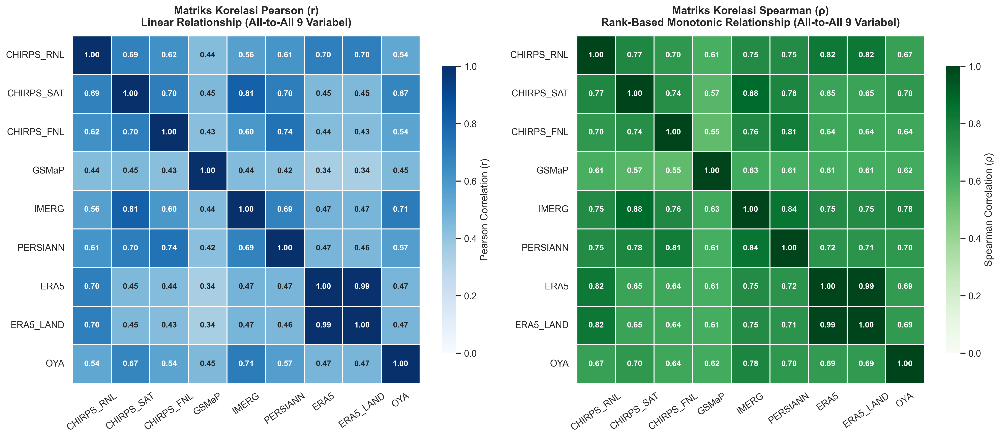

In [4]:
corr_pearson = df_eval[avail_cols].corr(method='pearson').round(3)
corr_spearman = df_eval[avail_cols].corr(method='spearman').round(3)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(17, 7.0))

sns.heatmap(corr_pearson, annot=True, fmt='.2f', cmap='Blues', vmin=0, vmax=1, square=True,
            linewidths=0.8, linecolor='white', annot_kws={'size': 9.5, 'weight': 'bold'}, ax=ax1,
            cbar_kws={'label': 'Pearson Correlation (r)', 'shrink': 0.8})
ax1.set_title('Matriks Korelasi Pearson (r)\nLinear Relationship (All-to-All 9 Variabel)', fontsize=13, fontweight='bold', pad=12)
ax1.tick_params(axis='x', rotation=35)

sns.heatmap(corr_spearman, annot=True, fmt='.2f', cmap='Greens', vmin=0, vmax=1, square=True,
            linewidths=0.8, linecolor='white', annot_kws={'size': 9.5, 'weight': 'bold'}, ax=ax2,
            cbar_kws={'label': 'Spearman Correlation (ρ)', 'shrink': 0.8})
ax2.set_title('Matriks Korelasi Spearman (ρ)\nRank-Based Monotonic Relationship (All-to-All 9 Variabel)', fontsize=13, fontweight='bold', pad=12)
ax2.tick_params(axis='x', rotation=35)

plt.tight_layout()
plt.savefig(os.path.join(out_dir, '02_heatmap_korelasi_pearson_spearman.png'), dpi=300, bbox_inches='tight')
plt.show()


## 4. Matriks Lengkap Evaluasi Metrik Inter-Model All-to-All ($9 \times 9$)
Menghitung seluruh metrik kesalahan dan efisiensi hidrologis untuk seluruh $9 \times 9$ pasangan (RMSE, MAE, PBIAS, KGE, NSE):
$$\text{RMSE} = \sqrt{\frac{1}{N}\sum (S_i - R_i)^2}, \quad \text{MAE} = \frac{1}{N}\sum |S_i - R_i|$$
$$\text{PBIAS} = \frac{\sum (S_i - R_i)}{\sum R_i} \times 100\%, \quad \text{KGE} = 1 - \sqrt{(r-1)^2 + (\alpha-1)^2 + (\beta-1)^2}$$


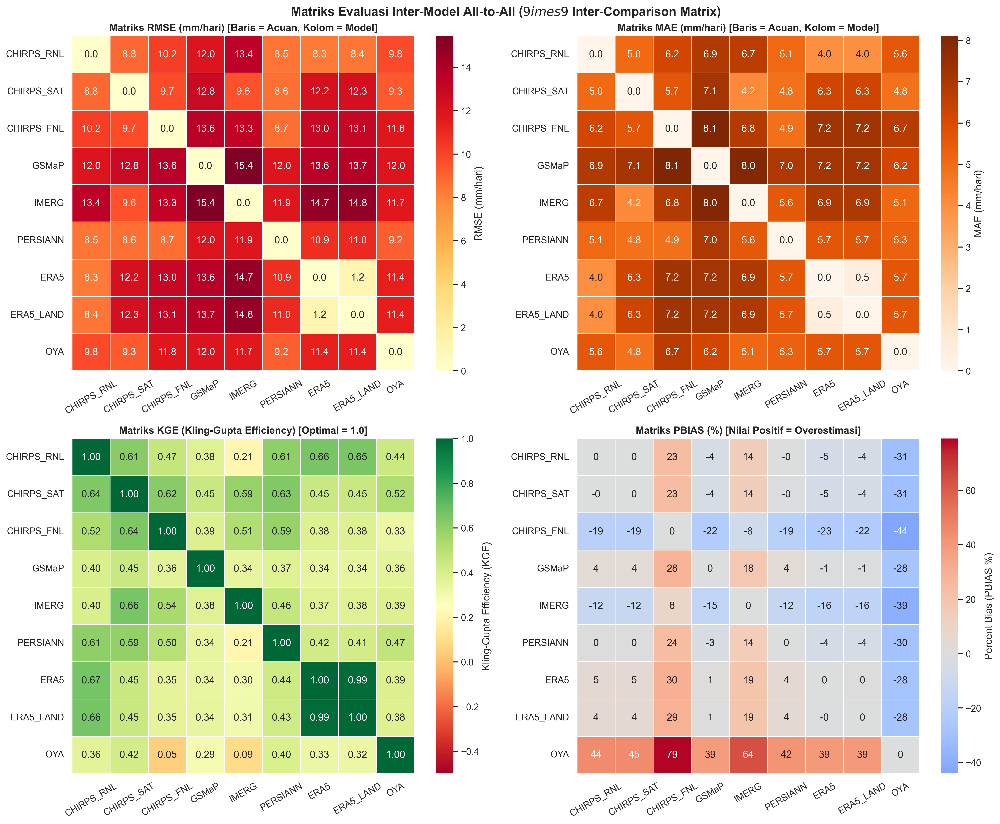

### 📋 Tabel Pasangan Inter-Comparison Teratas (36 Kombinasi Pasangan Unik)

,Acuan (X),Model (Y),N,Pearson r,Spearman ρ,R²,RMSE (mm),MAE (mm),Bias (mm),PBIAS (%),NSE,KGE
0,ERA5,ERA5_LAND,8036,0.994,0.993,0.989,1.22,0.46,0.03,0.4,0.988,0.987
1,ERA5_LAND,ERA5,8036,0.994,0.993,0.989,1.22,0.46,-0.03,-0.4,0.989,0.987
2,IMERG,CHIRPS_SAT,8036,0.809,0.876,0.655,9.57,4.16,-1.03,-12.1,0.647,0.660
3,CHIRPS_SAT,IMERG,8036,0.809,0.876,0.655,9.57,4.16,1.03,13.8,0.366,0.586
4,PERSIANN,IMERG,8032,0.685,0.840,0.469,11.90,5.59,1.05,14.2,-0.606,0.206
5,IMERG,PERSIANN,8032,0.685,0.840,0.469,11.90,5.59,-1.05,-12.4,0.454,0.463
6,CHIRPS_RNL,ERA5_LAND,8036,0.699,0.825,0.488,8.40,3.97,-0.32,-4.3,0.264,0.651
7,ERA5_LAND,CHIRPS_RNL,8036,0.699,0.825,0.488,8.40,3.97,0.32,4.5,0.463,0.662
8,CHIRPS_RNL,ERA5,8036,0.699,0.823,0.489,8.32,3.96,-0.35,-4.7,0.277,0.657
9,ERA5,CHIRPS_RNL,8036,0.699,0.823,0.489,8.32,3.96,0.35,4.9,0.461,0.666


In [5]:
pairwise_all = []
rmse_matrix = pd.DataFrame(index=avail_cols, columns=avail_cols, dtype=float)
mae_matrix = pd.DataFrame(index=avail_cols, columns=avail_cols, dtype=float)
pbias_matrix = pd.DataFrame(index=avail_cols, columns=avail_cols, dtype=float)
kge_matrix = pd.DataFrame(index=avail_cols, columns=avail_cols, dtype=float)

for col_ref in avail_cols:
    for col_sim in avail_cols:
        mask = df_eval[col_ref].notna() & df_eval[col_sim].notna()
        ref = df_eval.loc[mask, col_ref].values
        sim = df_eval.loc[mask, col_sim].values
        
        if len(ref) < 10:
            continue
            
        rp, _ = stats.pearsonr(ref, sim)
        rs, _ = stats.spearmanr(ref, sim)
        rmse = np.sqrt(np.mean((sim - ref)**2))
        mae = np.mean(np.abs(sim - ref))
        bias = np.mean(sim - ref)
        pbias = 100.0 * np.sum(sim - ref) / np.sum(ref) if np.sum(ref) != 0 else 0
        
        denom_nse = np.sum((ref - np.mean(ref))**2)
        nse = 1 - (np.sum((ref - sim)**2) / denom_nse) if denom_nse != 0 else -999
        
        r_kge = rp
        alpha_kge = np.std(sim) / np.std(ref) if np.std(ref) != 0 else 1
        beta_kge = np.mean(sim) / np.mean(ref) if np.mean(ref) != 0 else 1
        kge = 1 - np.sqrt((r_kge - 1)**2 + (alpha_kge - 1)**2 + (beta_kge - 1)**2)
        
        rmse_matrix.loc[col_ref, col_sim] = round(rmse, 2)
        mae_matrix.loc[col_ref, col_sim] = round(mae, 2)
        pbias_matrix.loc[col_ref, col_sim] = round(pbias, 1)
        kge_matrix.loc[col_ref, col_sim] = round(kge, 3)
        
        if col_ref != col_sim:
            pairwise_all.append({
                'Acuan (X)': col_ref,
                'Model (Y)': col_sim,
                'N': len(ref),
                'Pearson r': round(rp, 3),
                'Spearman ρ': round(rs, 3),
                'R²': round(rp**2, 3),
                'RMSE (mm)': round(rmse, 2),
                'MAE (mm)': round(mae, 2),
                'Bias (mm)': round(bias, 2),
                'PBIAS (%)': round(pbias, 1),
                'NSE': round(nse, 3),
                'KGE': round(kge, 3)
            })

df_pairwise_all = pd.DataFrame(pairwise_all)

fig, axes = plt.subplots(2, 2, figsize=(17, 14))
fig.suptitle('Matriks Evaluasi Inter-Model All-to-All ($9 \times 9$ Inter-Comparison Matrix)', fontsize=15, fontweight='bold', y=0.98)

sns.heatmap(rmse_matrix, annot=True, fmt='.1f', cmap='YlOrRd', ax=axes[0, 0], linewidths=0.5, cbar_kws={'label': 'RMSE (mm/hari)'})
axes[0, 0].set_title('Matriks RMSE (mm/hari) [Baris = Acuan, Kolom = Model]', fontsize=12, fontweight='bold')
axes[0, 0].tick_params(axis='x', rotation=30)

sns.heatmap(mae_matrix, annot=True, fmt='.1f', cmap='Oranges', ax=axes[0, 1], linewidths=0.5, cbar_kws={'label': 'MAE (mm/hari)'})
axes[0, 1].set_title('Matriks MAE (mm/hari) [Baris = Acuan, Kolom = Model]', fontsize=12, fontweight='bold')
axes[0, 1].tick_params(axis='x', rotation=30)

sns.heatmap(kge_matrix, annot=True, fmt='.2f', cmap='RdYlGn', vmin=-0.5, vmax=1.0, ax=axes[1, 0], linewidths=0.5, cbar_kws={'label': 'Kling-Gupta Efficiency (KGE)'})
axes[1, 0].set_title('Matriks KGE (Kling-Gupta Efficiency) [Optimal = 1.0]', fontsize=12, fontweight='bold')
axes[1, 0].tick_params(axis='x', rotation=30)

sns.heatmap(pbias_matrix, annot=True, fmt='.0f', cmap='coolwarm', center=0, ax=axes[1, 1], linewidths=0.5, cbar_kws={'label': 'Percent Bias (PBIAS %)'})
axes[1, 1].set_title('Matriks PBIAS (%) [Nilai Positif = Overestimasi]', fontsize=12, fontweight='bold')
axes[1, 1].tick_params(axis='x', rotation=30)

plt.tight_layout()
plt.savefig(os.path.join(out_dir, '02b_matriks_evaluasi_error_all_to_all.png'), dpi=300, bbox_inches='tight')
plt.show()

display(Markdown("### 📋 Tabel Pasangan Inter-Comparison Teratas (36 Kombinasi Pasangan Unik)"))
display(df_pairwise_all.sort_values('Spearman ρ', ascending=False).head(20).reset_index(drop=True))


## 5. Evaluasi Khusus Benchmark CHIRPS Reanalisis (`CHIRPS_RNL`)
Evaluasi komparasi terhadap `CHIRPS_RNL` sebagai acuan kontinu 22 tahun lengkap (8.036 hari tanpa missing value).


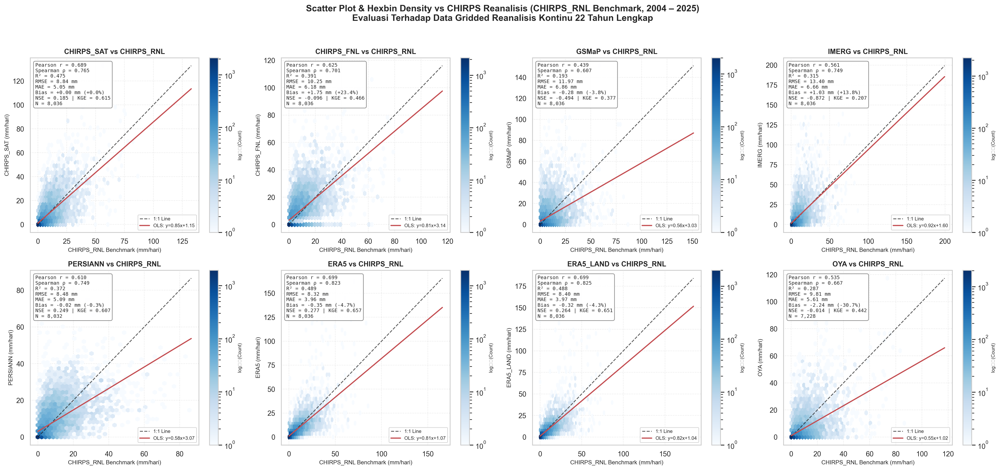

### 📊 Ringkasan Metrik Akurasi terhadap CHIRPS Reanalisis Benchmark

,Produk,Sampel (N),Pearson r,Spearman ρ,R²,RMSE (mm/hari),MAE (mm/hari),Bias (mm/hari),PBIAS (%),NSE,KGE,OLS Slope,OLS Intercept
0,ERA5_LAND,8036,0.699,0.825,0.488,8.40,3.97,-0.32,-4.3,0.264,0.651,0.818,1.038
1,ERA5,8036,0.699,0.823,0.489,8.32,3.96,-0.35,-4.7,0.277,0.657,0.809,1.071
2,CHIRPS_SAT,8036,0.689,0.765,0.475,8.84,5.05,0.00,0.0,0.185,0.615,0.846,1.149
3,IMERG,8036,0.561,0.749,0.315,13.40,6.66,1.03,13.8,-0.872,0.207,0.923,1.603
4,PERSIANN,8032,0.610,0.749,0.372,8.48,5.09,-0.02,-0.3,0.249,0.607,0.585,3.068
5,CHIRPS_FNL,8036,0.625,0.701,0.391,10.25,6.18,1.75,23.4,-0.096,0.466,0.813,3.137
6,OYA,7228,0.535,0.667,0.287,9.81,5.61,-2.24,-30.7,-0.014,0.442,0.553,1.017
7,GSMaP,8036,0.439,0.607,0.193,11.97,6.86,-0.28,-3.8,-0.494,0.377,0.556,3.027


In [6]:
chirps_ref_cols = [c for c in avail_cols if c != 'CHIRPS_RNL']
n_comp = len(chirps_ref_cols)
ncols_sub = 4
nrows_sub = int(np.ceil(n_comp / ncols_sub))

fig, axes = plt.subplots(nrows_sub, ncols_sub, figsize=(5.5 * ncols_sub, 5.0 * nrows_sub), squeeze=False)
fig.suptitle('Scatter Plot & Hexbin Density vs CHIRPS Reanalisis (CHIRPS_RNL Benchmark, 2004 – 2025)\nEvaluasi Terhadap Data Gridded Reanalisis Kontinu 22 Tahun Lengkap',
             fontsize=14, fontweight='bold', y=1.02)

chirps_metrics = []

for idx, col_name in enumerate(chirps_ref_cols):
    row_idx = idx // ncols_sub
    col_idx = idx % ncols_sub
    ax = axes[row_idx][col_idx]
    
    mask = df_eval['CHIRPS_RNL'].notna() & df_eval[col_name].notna()
    x_ref = df_eval.loc[mask, 'CHIRPS_RNL'].values
    y_sim = df_eval.loc[mask, col_name].values
    
    n_samples = len(x_ref)
    rp, _ = stats.pearsonr(x_ref, y_sim)
    rs, _ = stats.spearmanr(x_ref, y_sim)
    slope, intercept, _, _, _ = stats.linregress(x_ref, y_sim)
    r2 = rp ** 2
    
    bias = np.mean(y_sim - x_ref)
    pbias = 100.0 * np.sum(y_sim - x_ref) / np.sum(x_ref) if np.sum(x_ref) != 0 else 0
    mae = np.mean(np.abs(y_sim - x_ref))
    rmse = np.sqrt(np.mean((y_sim - x_ref)**2))
    
    denom_nse = np.sum((x_ref - np.mean(x_ref))**2)
    nse = 1 - (np.sum((x_ref - y_sim)**2) / denom_nse) if denom_nse != 0 else -999
    
    r_kge = rp
    alpha_kge = np.std(y_sim) / np.std(x_ref) if np.std(x_ref) != 0 else 1
    beta_kge = np.mean(y_sim) / np.mean(x_ref) if np.mean(x_ref) != 0 else 1
    kge = 1 - np.sqrt((r_kge - 1)**2 + (alpha_kge - 1)**2 + (beta_kge - 1)**2)
    
    chirps_metrics.append({
        'Produk': col_name,
        'Sampel (N)': n_samples,
        'Pearson r': round(rp, 3),
        'Spearman ρ': round(rs, 3),
        'R²': round(r2, 3),
        'RMSE (mm/hari)': round(rmse, 2),
        'MAE (mm/hari)': round(mae, 2),
        'Bias (mm/hari)': round(bias, 2),
        'PBIAS (%)': round(pbias, 1),
        'NSE': round(nse, 3),
        'KGE': round(kge, 3),
        'OLS Slope': round(slope, 3),
        'OLS Intercept': round(intercept, 3)
    })
    
    hb = ax.hexbin(x_ref, y_sim, gridsize=40, cmap='Blues', mincnt=1, bins='log')
    cb = plt.colorbar(hb, ax=ax)
    cb.set_label('log₁₀(Count)', fontsize=7.5)
    
    jmax = max(x_ref.max(), y_sim.max())
    ax.plot([0, jmax], [0, jmax], 'k--', lw=1.3, alpha=0.7, label='1:1 Line')
    x_line = np.linspace(0, jmax, 100)
    ax.plot(x_line, slope * x_line + intercept, 'r-', lw=1.8, label=f'OLS: y={slope:.2f}x+{intercept:.2f}')
    
    stats_box = (
        f"Pearson r = {rp:.3f}\n"
        f"Spearman ρ = {rs:.3f}\n"
        f"R² = {r2:.3f}\n"
        f"RMSE = {rmse:.2f} mm\n"
        f"MAE = {mae:.2f} mm\n"
        f"Bias = {bias:+.2f} mm ({pbias:+.1f}%)\n"
        f"NSE = {nse:.3f} | KGE = {kge:.3f}\n"
        f"N = {n_samples:,}"
    )
    ax.text(0.03, 0.97, stats_box, transform=ax.transAxes, fontsize=7.8, va='top', ha='left',
            family='monospace', bbox=dict(facecolor='white', alpha=0.88, edgecolor='gray', boxstyle='round,pad=0.35'))
    
    ax.set_title(f'{col_name} vs CHIRPS_RNL', fontsize=11, fontweight='bold')
    ax.set_xlabel('CHIRPS_RNL Benchmark (mm/hari)', fontsize=9)
    ax.set_ylabel(f'{col_name} (mm/hari)', fontsize=9)
    ax.legend(loc='lower right', fontsize=7.5)
    ax.grid(True, linestyle=':', alpha=0.5)

for empty_idx in range(n_comp, nrows_sub * ncols_sub):
    axes[empty_idx // ncols_sub][empty_idx % ncols_sub].set_visible(False)

plt.tight_layout()
plt.savefig(os.path.join(out_dir, '03b_scatter_hexbin_vs_chirps_rnl.png'), dpi=300, bbox_inches='tight')
plt.show()

df_chirps_metrics = pd.DataFrame(chirps_metrics)
display(Markdown("### 📊 Ringkasan Metrik Akurasi terhadap CHIRPS Reanalisis Benchmark"))
display(df_chirps_metrics.sort_values('Spearman ρ', ascending=False).reset_index(drop=True))


## 6. Visualisasi Bar Chart Perbandingan Akurasi vs CHIRPS_RNL
Perbandingan Pearson $r$, Spearman $\rho$, RMSE, MAE, NSE, KGE, dan PBIAS % terhadap `CHIRPS_RNL`.


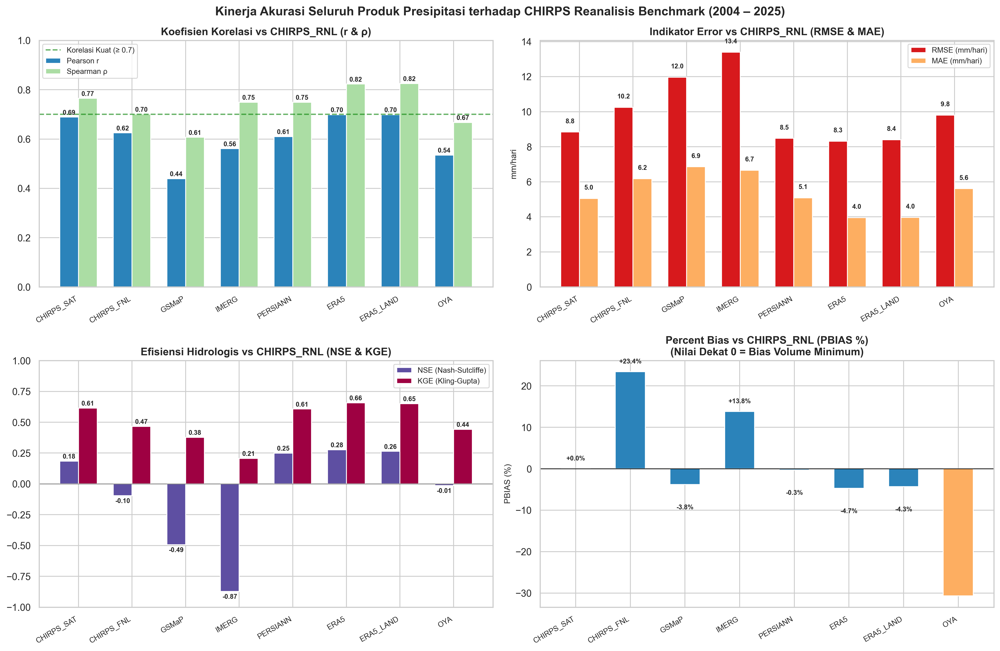

In [7]:
fig, axes = plt.subplots(2, 2, figsize=(16, 10.5))
fig.suptitle('Kinerja Akurasi Seluruh Produk Presipitasi terhadap CHIRPS Reanalisis Benchmark (2004 – 2025)',
             fontsize=14, fontweight='bold', y=0.98)

x_pos = np.arange(len(df_chirps_metrics))
width = 0.35

# 1. Pearson r & Spearman rho vs CHIRPS_RNL
ax1 = axes[0, 0]
ax1.bar(x_pos - width/2, df_chirps_metrics['Pearson r'], width, label='Pearson r', color='#2b83ba')
ax1.bar(x_pos + width/2, df_chirps_metrics['Spearman ρ'], width, label='Spearman ρ', color='#abdda4')
ax1.set_title('Koefisien Korelasi vs CHIRPS_RNL (r & ρ)', fontsize=12, fontweight='bold')
ax1.set_xticks(x_pos)
ax1.set_xticklabels(df_chirps_metrics['Produk'], rotation=30, ha='right', fontsize=8.5)
ax1.set_ylim(0, 1.0)
ax1.axhline(0.7, color='green', linestyle='--', alpha=0.6, label='Korelasi Kuat (≥ 0.7)')
ax1.legend(fontsize=8.5)
for p in ax1.patches:
    h = p.get_height()
    if h > 0:
        ax1.annotate(f'{h:.2f}', (p.get_x() + p.get_width()/2, h + 0.01), ha='center', fontsize=7.5, fontweight='bold')

# 2. Error Metrics (RMSE & MAE) vs CHIRPS_RNL
ax2 = axes[0, 1]
df_plot_err = df_chirps_metrics.copy()
ax2.bar(x_pos - width/2, df_plot_err['RMSE (mm/hari)'], width, label='RMSE (mm/hari)', color='#d7191c')
ax2.bar(x_pos + width/2, df_plot_err['MAE (mm/hari)'], width, label='MAE (mm/hari)', color='#fdae61')
ax2.set_title('Indikator Error vs CHIRPS_RNL (RMSE & MAE)', fontsize=12, fontweight='bold')
ax2.set_xticks(x_pos)
ax2.set_xticklabels(df_plot_err['Produk'], rotation=30, ha='right', fontsize=8.5)
ax2.set_ylabel('mm/hari', fontsize=9.5)
ax2.legend(fontsize=8.5)
for p in ax2.patches:
    h = p.get_height()
    if h > 0 and h < 50:
        ax2.annotate(f'{h:.1f}', (p.get_x() + p.get_width()/2, h + 0.5), ha='center', fontsize=7.5, fontweight='bold')

# 3. Efisiensi Model (NSE & KGE) vs CHIRPS_RNL
ax3 = axes[1, 0]
ax3.bar(x_pos - width/2, df_chirps_metrics['NSE'], width, label='NSE (Nash-Sutcliffe)', color='#5e4fa2')
ax3.bar(x_pos + width/2, df_chirps_metrics['KGE'], width, label='KGE (Kling-Gupta)', color='#9e0142')
ax3.set_title('Efisiensi Hidrologis vs CHIRPS_RNL (NSE & KGE)', fontsize=12, fontweight='bold')
ax3.set_xticks(x_pos)
ax3.set_xticklabels(df_chirps_metrics['Produk'], rotation=30, ha='right', fontsize=8.5)
ax3.axhline(0, color='gray', linestyle='-', linewidth=0.8)
ax3.set_ylim(-1.0, 1.0)
ax3.legend(fontsize=8.5)
for p in ax3.patches:
    h = p.get_height()
    if h > -1.0 and h < 1.0:
        ax3.annotate(f'{h:.2f}', (p.get_x() + p.get_width()/2, h + (0.02 if h>=0 else -0.06)), ha='center', fontsize=7.5, fontweight='bold')

# 4. Percent Bias (PBIAS %) vs CHIRPS_RNL
ax4 = axes[1, 1]
colors_bias = ['#d7191c' if abs(b) > 50 else '#fdae61' if abs(b) > 25 else '#2b83ba' for b in df_chirps_metrics['PBIAS (%)']]
bars = ax4.bar(df_chirps_metrics['Produk'], df_chirps_metrics['PBIAS (%)'], color=colors_bias, width=0.55)
ax4.set_title('Percent Bias vs CHIRPS_RNL (PBIAS %)\n(Nilai Dekat 0 = Bias Volume Minimum)', fontsize=12, fontweight='bold')
ax4.set_xticks(x_pos)
ax4.set_xticklabels(df_chirps_metrics['Produk'], rotation=30, ha='right', fontsize=8.5)
ax4.set_ylabel('PBIAS (%)', fontsize=9.5)
ax4.axhline(0, color='black', linestyle='-', linewidth=0.8)
for bar, val in zip(bars, df_chirps_metrics['PBIAS (%)']):
    h = bar.get_height()
    if abs(h) < 150:
        ax4.annotate(f'{h:+.1f}%', (bar.get_x() + bar.get_width()/2, h + (2.0 if h>=0 else -6.0)), ha='center', fontsize=7.5, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(out_dir, '04b_bar_akurasi_vs_chirps_rnl.png'), dpi=300, bbox_inches='tight')
plt.show()


## 7. Evaluasi Kategorikal Deteksi Hujan vs CHIRPS_RNL (Threshold Scores)
Skor kontingensi deteksi kejadian hujan (CSI, POD, FAR, HSS) pada ambang batas $0.1, 0.5, 1.0, 5.0, 10.0, 20.0, 50.0\text{ mm/hari}$ terhadap `CHIRPS_RNL`.


### 📋 Tabel Metrik Kontingensi Deteksi Hujan (Threshold: 1.0 mm/hari vs CHIRPS_RNL)

,Acuan Benchmark,Produk Presipitasi,Ambang Batas (mm/hari),Hits,Misses,False Alarms,Correct Negatives,POD (Hit Rate),FAR (False Alarm),CSI (Threat Score),FBI (Frequency Bias),HSS (Heidke Skill),ETS (Equitable Threat)
0,CHIRPS_RNL,CHIRPS_SAT,1.0,4354,1389,353,1940,0.758,0.075,0.714,0.820,0.532,0.362
1,CHIRPS_RNL,CHIRPS_FNL,1.0,3799,1944,208,2085,0.662,0.052,0.638,0.698,0.465,0.303
2,CHIRPS_RNL,GSMaP,1.0,3801,1942,362,1931,0.662,0.087,0.623,0.725,0.418,0.264
3,CHIRPS_RNL,IMERG,1.0,3961,1782,235,2058,0.690,0.056,0.663,0.731,0.488,0.323
4,CHIRPS_RNL,PERSIANN,1.0,4543,1196,383,1910,0.792,0.078,0.742,0.858,0.564,0.393
5,CHIRPS_RNL,ERA5,1.0,5260,483,751,1542,0.916,0.125,0.810,1.047,0.610,0.439
6,CHIRPS_RNL,ERA5_LAND,1.0,5263,480,767,1526,0.916,0.127,0.808,1.050,0.605,0.433
7,CHIRPS_RNL,OYA,1.0,3010,2116,137,1965,0.587,0.044,0.572,0.614,0.409,0.257


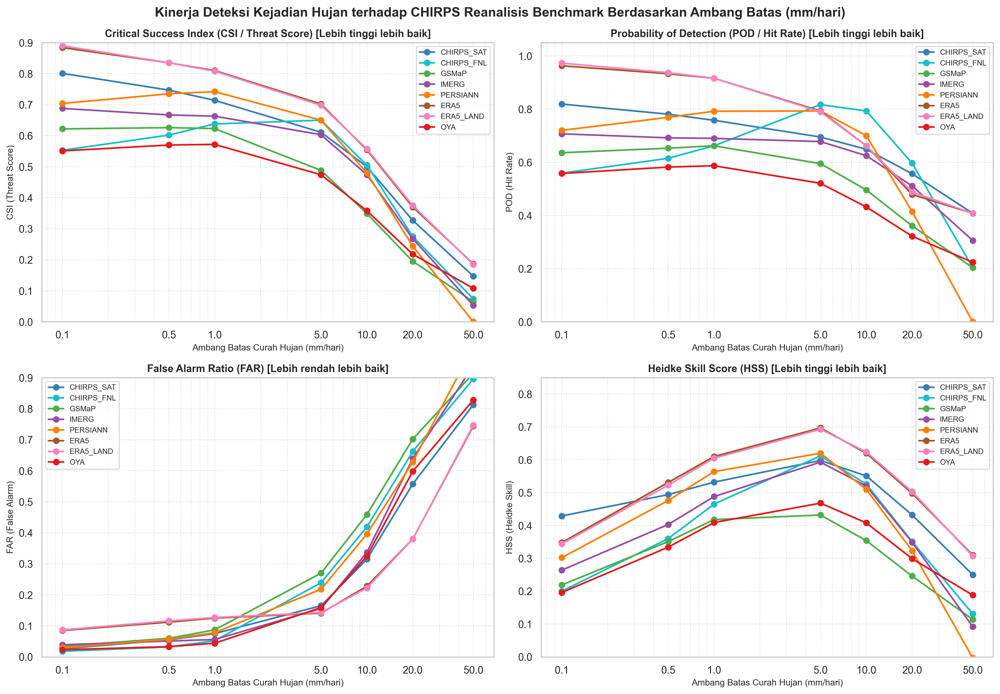

In [8]:
thresholds = [0.1, 0.5, 1.0, 5.0, 10.0, 20.0, 50.0]
contingency_chirps = []

for sat_name in chirps_ref_cols:
    mask = df_eval['CHIRPS_RNL'].notna() & df_eval[sat_name].notna()
    obs_vals = df_eval.loc[mask, 'CHIRPS_RNL'].values
    sim_vals = df_eval.loc[mask, sat_name].values
    
    for th in thresholds:
        obs_rain = obs_vals >= th
        sim_rain = sim_vals >= th
        
        hits = int(np.sum(obs_rain & sim_rain))
        misses = int(np.sum(obs_rain & ~sim_rain))
        false_alarms = int(np.sum(~obs_rain & sim_rain))
        correct_negatives = int(np.sum(~obs_rain & ~sim_rain))
        total = hits + misses + false_alarms + correct_negatives
        
        pod = hits / (hits + misses) if (hits + misses) > 0 else 0
        far = false_alarms / (hits + false_alarms) if (hits + false_alarms) > 0 else 0
        csi = hits / (hits + misses + false_alarms) if (hits + misses + false_alarms) > 0 else 0
        fbi = (hits + false_alarms) / (hits + misses) if (hits + misses) > 0 else 0
        
        hss_denom = ((hits + misses)*(misses + correct_negatives) + (hits + false_alarms)*(false_alarms + correct_negatives))
        hss = 2 * (hits * correct_negatives - misses * false_alarms) / hss_denom if hss_denom > 0 else 0
        
        hits_random = (hits + misses) * (hits + false_alarms) / total if total > 0 else 0
        ets_denom = hits + misses + false_alarms - hits_random
        ets = (hits - hits_random) / ets_denom if ets_denom > 0 else 0
        
        contingency_chirps.append({
            'Acuan Benchmark': 'CHIRPS_RNL',
            'Produk Presipitasi': sat_name,
            'Ambang Batas (mm/hari)': th,
            'Hits': hits,
            'Misses': misses,
            'False Alarms': false_alarms,
            'Correct Negatives': correct_negatives,
            'POD (Hit Rate)': round(pod, 3),
            'FAR (False Alarm)': round(far, 3),
            'CSI (Threat Score)': round(csi, 3),
            'FBI (Frequency Bias)': round(fbi, 3),
            'HSS (Heidke Skill)': round(hss, 3),
            'ETS (Equitable Threat)': round(ets, 3)
        })

df_contingency_chirps = pd.DataFrame(contingency_chirps)

display(Markdown("### 📋 Tabel Metrik Kontingensi Deteksi Hujan (Threshold: 1.0 mm/hari vs CHIRPS_RNL)"))
display(df_contingency_chirps[df_contingency_chirps['Ambang Batas (mm/hari)'] == 1.0].reset_index(drop=True))

fig, axes = plt.subplots(2, 2, figsize=(15, 10.5))
fig.suptitle('Kinerja Deteksi Kejadian Hujan terhadap CHIRPS Reanalisis Benchmark Berdasarkan Ambang Batas (mm/hari)',
             fontsize=14, fontweight='bold', y=0.98)

palette = {
    'CHIRPS_SAT': '#377eb8', 'CHIRPS_FNL': '#17becf', 'GSMaP': '#4daf4a', 'IMERG': '#984ea3',
    'PERSIANN': '#ff7f00', 'ERA5': '#a65628', 'ERA5_LAND': '#f781bf', 'OYA': '#e41a1c'
}

for ax, metric, title, ylim in zip(
    axes.flatten(),
    ['CSI (Threat Score)', 'POD (Hit Rate)', 'FAR (False Alarm)', 'HSS (Heidke Skill)'],
    ['Critical Success Index (CSI / Threat Score) [Lebih tinggi lebih baik]',
     'Probability of Detection (POD / Hit Rate) [Lebih tinggi lebih baik]',
     'False Alarm Ratio (FAR) [Lebih rendah lebih baik]',
     'Heidke Skill Score (HSS) [Lebih tinggi lebih baik]'],
    [(0, 0.9), (0, 1.05), (0, 0.9), (0, 0.85)]
):
    for sat_name in chirps_ref_cols:
        sub = df_contingency_chirps[df_contingency_chirps['Produk Presipitasi'] == sat_name]
        ax.plot(sub['Ambang Batas (mm/hari)'], sub[metric], marker='o', lw=1.8, label=sat_name, color=palette.get(sat_name, '#333333'))
    ax.set_title(title, fontsize=11, fontweight='bold')
    ax.set_xlabel('Ambang Batas Curah Hujan (mm/hari)', fontsize=9.5)
    ax.set_ylabel(metric, fontsize=9.5)
    ax.set_xscale('log')
    ax.set_xticks(thresholds)
    ax.set_xticklabels([str(t) for t in thresholds])
    ax.set_ylim(ylim)
    ax.legend(fontsize=8)
    ax.grid(True, which='both', linestyle=':', alpha=0.6)

plt.tight_layout()
plt.savefig(os.path.join(out_dir, '05b_kategorikal_skill_vs_chirps_rnl.png'), dpi=300, bbox_inches='tight')
plt.show()


## 8. Analisis Tren Temporal Jangka Panjang (2004 – 2025)
Akumulasi tahunan (mm/tahun), deteksi tahun basah ekstrem (La Niña 2010, 2016, 2022) dan tahun kering ekstrem (El Niño 2006, 2015, 2019, 2023).


### 🌧️ Tabel Akumulasi Curah Hujan Tahunan (mm/tahun)

,CHIRPS_RNL,CHIRPS_SAT,CHIRPS_FNL,GSMaP,IMERG,PERSIANN,ERA5,ERA5_LAND,OYA
year,,,,,,,,,
2004,2336.0,2336.0,2793.2,2351.8,3011.1,3102.2,2380.9,2412.6,0.0
2005,2745.0,2745.0,3103.0,3834.9,3473.7,3128.0,2444.4,2481.0,635.1
2006,1857.1,1857.1,2402.5,1714.3,2458.4,2231.0,2029.0,2025.6,853.2
2007,2422.0,2422.0,3292.1,2501.8,2908.7,2571.6,2522.5,2493.3,961.4
2008,2295.5,2295.5,3069.3,2189.8,2863.2,2512.0,2471.0,2464.9,876.7
2009,2370.5,2370.5,2872.5,2511.7,2870.7,2505.2,2053.1,2054.3,819.6
2010,4181.6,4181.6,4995.2,3802.3,4444.1,3908.1,3431.4,3409.4,1133.2
2011,2452.6,2452.6,2940.0,2184.6,2820.1,2437.1,2461.5,2471.2,909.5
2012,2562.9,2562.9,2966.0,2288.5,2913.9,2337.8,2411.1,2427.6,701.0


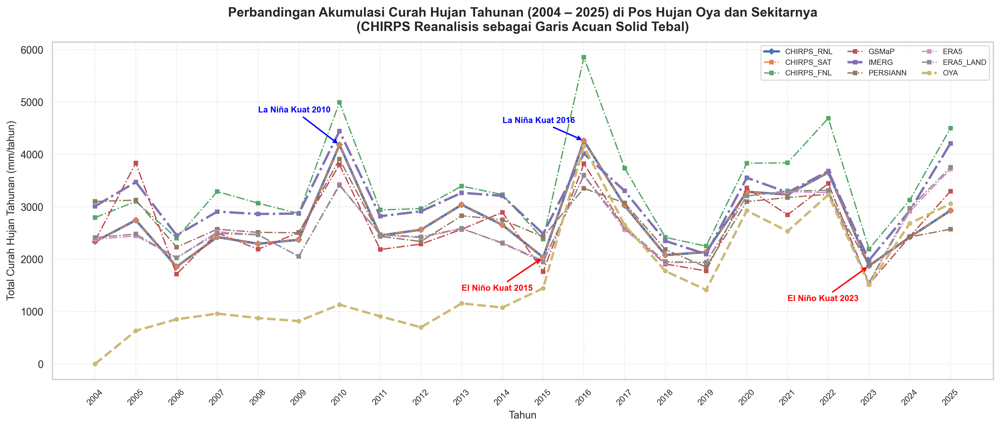

In [9]:
df['year'] = df.index.year
yearly_rain = df.groupby('year')[avail_cols].sum()

display(Markdown("### 🌧️ Tabel Akumulasi Curah Hujan Tahunan (mm/tahun)"))
display(yearly_rain.round(1))

fig, ax = plt.subplots(figsize=(15, 6.5))
for col in ['CHIRPS_RNL', 'CHIRPS_SAT', 'CHIRPS_FNL', 'GSMaP', 'IMERG', 'PERSIANN', 'ERA5', 'ERA5_LAND', 'OYA']:
    if col in yearly_rain.columns:
        ls = '-' if col == 'CHIRPS_RNL' else ('--' if col == 'OYA' else '-.')
        lw = 2.5 if col in ['CHIRPS_RNL', 'IMERG', 'OYA'] else 1.4
        marker = 'D' if col == 'CHIRPS_RNL' else ('o' if col == 'OYA' else 's')
        ax.plot(yearly_rain.index, yearly_rain[col], label=f'{col}', lw=lw, linestyle=ls, marker=marker, markersize=4.0)

ax.set_title('Perbandingan Akumulasi Curah Hujan Tahunan (2004 – 2025) di Pos Hujan Oya dan Sekitarnya\n(CHIRPS Reanalisis sebagai Garis Acuan Solid Tebal)',
             fontsize=14, fontweight='bold', pad=12)
ax.set_xlabel('Tahun', fontsize=11)
ax.set_ylabel('Total Curah Hujan Tahunan (mm/tahun)', fontsize=11)
ax.set_xticks(yearly_rain.index)
ax.set_xticklabels(yearly_rain.index, rotation=45, fontsize=9)
ax.legend(loc='upper right', fontsize=8.0, ncol=3)
ax.grid(True, linestyle=':', alpha=0.6)

# Anotasi fenomena ekstrem
ax.annotate('La Niña Kuat 2010', xy=(2010, yearly_rain.loc[2010, 'CHIRPS_RNL']), xytext=(2008, 4800),
            arrowprops=dict(arrowstyle="->", color="blue", lw=1.5), fontsize=9, fontweight='bold', color='blue')
ax.annotate('La Niña Kuat 2016', xy=(2016, yearly_rain.loc[2016, 'CHIRPS_RNL']), xytext=(2014, 4600),
            arrowprops=dict(arrowstyle="->", color="blue", lw=1.5), fontsize=9, fontweight='bold', color='blue')
ax.annotate('El Niño Kuat 2015', xy=(2015, yearly_rain.loc[2015, 'CHIRPS_RNL']), xytext=(2013, 1400),
            arrowprops=dict(arrowstyle="->", color="red", lw=1.5), fontsize=9, fontweight='bold', color='red')
ax.annotate('El Niño Kuat 2023', xy=(2023, yearly_rain.loc[2023, 'CHIRPS_RNL']), xytext=(2021, 1200),
            arrowprops=dict(arrowstyle="->", color="red", lw=1.5), fontsize=9, fontweight='bold', color='red')

plt.tight_layout()
plt.savefig(os.path.join(out_dir, '06_tren_akumulasi_hujan_tahunan_2004_2025.png'), dpi=300, bbox_inches='tight')
plt.show()


## 9. Dinamika Moving Average 30-Hari & Kurva Massa Ganda (*Double-Mass Curve*)
- **30-Day Moving Average**: Menghaluskan variabilitas frekuensi tinggi harian untuk mengevaluasi siklus intra-musiman (*MJO / Monsoonal Surges*).
- **Double-Mass Curve**: Memvalidasi homogenitas dan stabilitas rasio kumulatif terhadap benchmark `CHIRPS_RNL`.


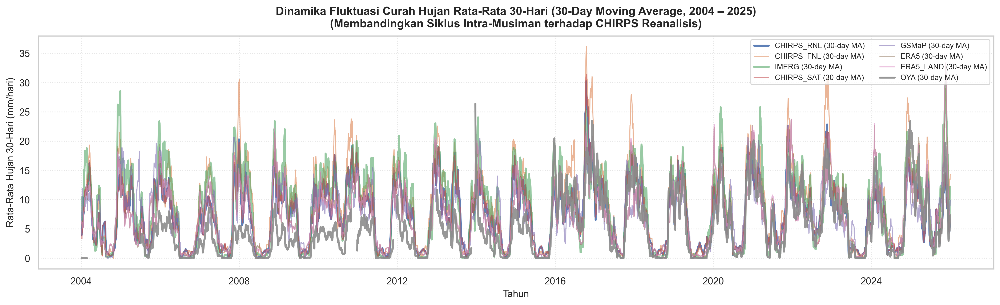

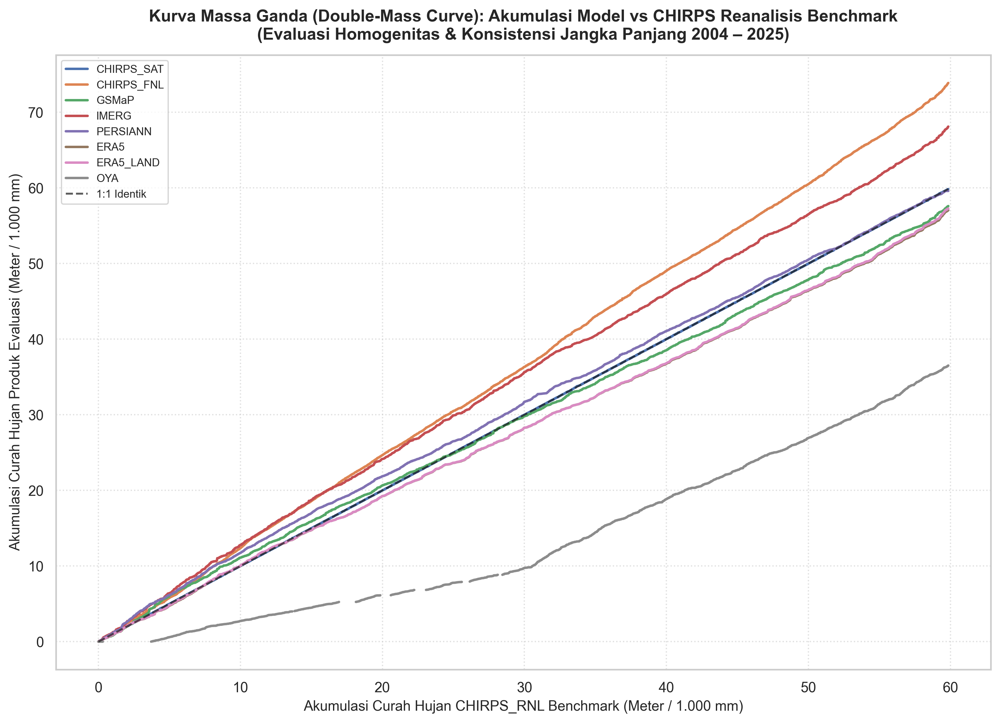

In [10]:
# 1. Moving Average 30-Hari
df_rolling_30d = df[avail_cols].rolling(window=30, min_periods=5).mean()

fig, ax = plt.subplots(figsize=(16, 5))
for col in ['CHIRPS_RNL', 'CHIRPS_FNL', 'IMERG', 'CHIRPS_SAT', 'GSMaP', 'ERA5', 'ERA5_LAND', 'OYA']:
    if col in df_rolling_30d.columns:
        lw = 2.2 if col in ['CHIRPS_RNL', 'IMERG', 'OYA'] else 1.1
        alpha = 0.9 if col in ['CHIRPS_RNL', 'OYA'] else 0.60
        ax.plot(df_rolling_30d.index, df_rolling_30d[col], label=f'{col} (30-day MA)', lw=lw, alpha=alpha)

ax.set_title('Dinamika Fluktuasi Curah Hujan Rata-Rata 30-Hari (30-Day Moving Average, 2004 – 2025)\n(Membandingkan Siklus Intra-Musiman terhadap CHIRPS Reanalisis)',
             fontsize=13, fontweight='bold', pad=10)
ax.set_xlabel('Tahun', fontsize=11)
ax.set_ylabel('Rata-Rata Hujan 30-Hari (mm/hari)', fontsize=11)
ax.legend(loc='upper right', fontsize=8.5, ncol=2)
ax.grid(True, linestyle=':', alpha=0.5)

plt.tight_layout()
plt.savefig(os.path.join(out_dir, '07_timeseries_30day_moving_average.png'), dpi=300, bbox_inches='tight')
plt.show()

# 2. Kurva Massa Ganda (Double-Mass Curve)
df_sorted = df[avail_cols].sort_index()
cum_chirps = df_sorted['CHIRPS_RNL'].cumsum() / 1000.0

fig, ax = plt.subplots(figsize=(11, 8))
for col_name in ['CHIRPS_SAT', 'CHIRPS_FNL', 'GSMaP', 'IMERG', 'PERSIANN', 'ERA5', 'ERA5_LAND', 'OYA']:
    if col_name in df_sorted.columns:
        cum_sim = df_sorted[col_name].cumsum() / 1000.0
        ax.plot(cum_chirps, cum_sim, label=f'{col_name}', lw=1.9)

max_cum = cum_chirps.max()
ax.plot([0, max_cum], [0, max_cum], 'k--', lw=1.5, alpha=0.7, label='1:1 Identik')

ax.set_title('Kurva Massa Ganda (Double-Mass Curve): Akumulasi Model vs CHIRPS Reanalisis Benchmark\n(Evaluasi Homogenitas & Konsistensi Jangka Panjang 2004 – 2025)',
             fontsize=13, fontweight='bold', pad=12)
ax.set_xlabel('Akumulasi Curah Hujan CHIRPS_RNL Benchmark (Meter / 1.000 mm)', fontsize=11)
ax.set_ylabel('Akumulasi Curah Hujan Produk Evaluasi (Meter / 1.000 mm)', fontsize=11)
ax.legend(loc='upper left', fontsize=8.5)
ax.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.savefig(os.path.join(out_dir, '08_kurva_massa_ganda_double_mass_curve.png'), dpi=300, bbox_inches='tight')
plt.show()


## 10. Pola Musiman, Klimatologi Bulanan & Boxplot Variabilitas
- **Klimatologi Bulanan**: Pola siklus monsun tropis monsunal dengan puncak hujan di Musim Hujan (Nov–Mar: $300 - 450\text{ mm/bulan}$) dan palung kemarau (Jun–Sep: $25 - 95\text{ mm/bulan}$).
- **Boxplot Variabilitas Bulanan**: Menampilkan sebaran interkuartil dan deteksi kejadian *outlier* bulanan.


### 🗓️ Tabel Rata-Rata Klimatologi Curah Hujan Bulanan (mm/bulan)

,CHIRPS_RNL,CHIRPS_SAT,CHIRPS_FNL,GSMaP,IMERG,PERSIANN,ERA5,ERA5_LAND,OYA
Jan,328.6,328.6,332.2,311.9,394.8,325.5,333.6,334.5,241.5
Feb,340.4,340.4,425.3,341.9,448.5,373.4,327.5,322.6,236.7
Mar,319.3,319.3,387.1,240.4,386.0,350.3,285.8,285.6,232.2
Apr,207.9,207.9,282.5,220.0,285.7,277.8,218.7,215.4,155.2
May,210.2,210.2,281.7,196.3,225.4,197.8,150.5,150.1,113.4
Jun,102.4,102.4,135.6,159.8,115.1,107.0,110.9,111.9,76.8
Jul,88.6,88.6,84.5,93.9,66.4,68.1,67.0,69.5,31.4
Aug,76.0,76.0,61.8,52.8,32.8,39.4,45.2,47.5,25.7
Sep,87.6,87.6,139.7,121.8,93.8,93.0,101.3,102.8,50.8
Oct,231.6,231.6,274.4,203.3,215.4,177.6,195.6,198.6,152.5


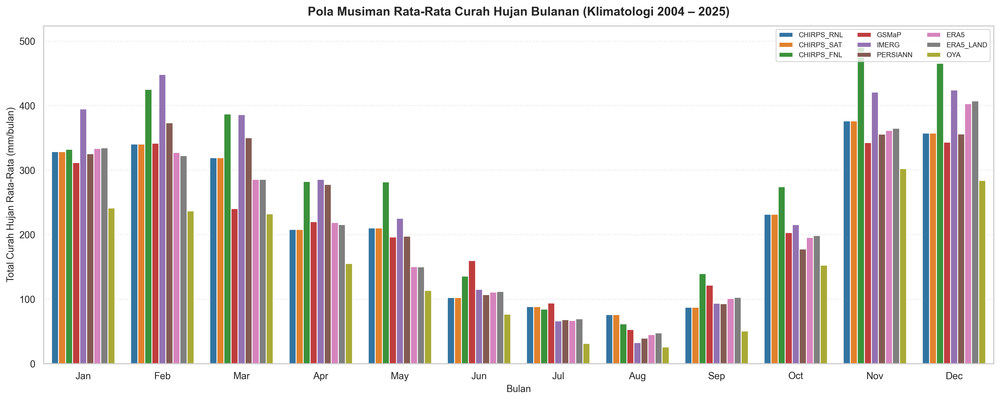

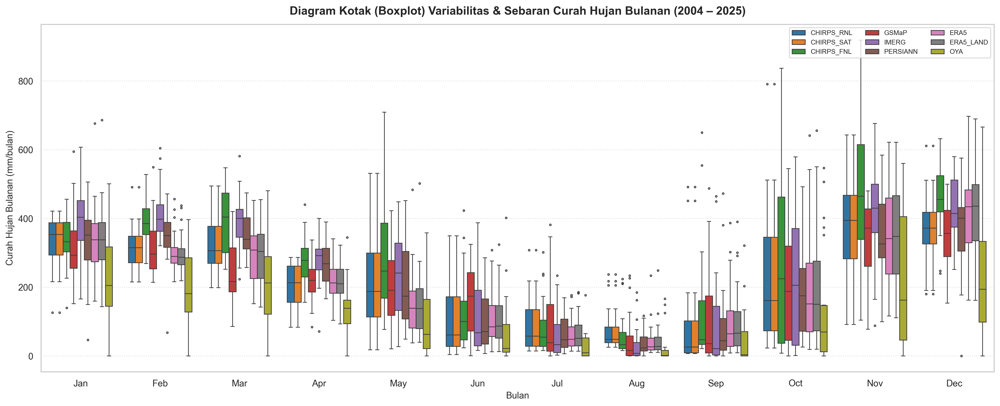

In [11]:
df['month'] = df.index.month
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Total bulanan rata-rata (mm/bulan)
monthly_mean_daily = df.groupby('month')[avail_cols].mean()
monthly_clim = monthly_mean_daily.copy()
for c in avail_cols:
    monthly_clim[c] = monthly_clim[c] * 30.4375

monthly_clim.index = month_order
display(Markdown("### 🗓️ Tabel Rata-Rata Klimatologi Curah Hujan Bulanan (mm/bulan)"))
display(monthly_clim.round(1))

# Bar chart klimatologi
fig, ax = plt.subplots(figsize=(16, 6.5))
clim_plot_cols = avail_cols
df_clim_melted = monthly_clim[clim_plot_cols].reset_index().rename(columns={'index': 'Bulan'}).melt(id_vars='Bulan', var_name='Dataset', value_name='Curah_Hujan_mm')
df_clim_melted['Bulan'] = pd.Categorical(df_clim_melted['Bulan'], categories=month_order, ordered=True)

sns.barplot(data=df_clim_melted, x='Bulan', y='Curah_Hujan_mm', hue='Dataset', palette='tab10', ax=ax)
ax.set_title('Pola Musiman Rata-Rata Curah Hujan Bulanan (Klimatologi 2004 – 2025)', fontsize=14, fontweight='bold', pad=12)
ax.set_xlabel('Bulan', fontsize=11)
ax.set_ylabel('Total Curah Hujan Rata-Rata (mm/bulan)', fontsize=11)
ax.legend(loc='upper right', fontsize=8.0, ncol=3)
ax.grid(True, axis='y', linestyle=':', alpha=0.6)

plt.tight_layout()
plt.savefig(os.path.join(out_dir, '09_klimatologi_bulanan_barchart.png'), dpi=300, bbox_inches='tight')
plt.show()

# Boxplot Variabilitas Bulanan
df_monthly_totals = df[clim_plot_cols].resample('ME').sum()
df_monthly_totals['month_name'] = df_monthly_totals.index.strftime('%b')
df_monthly_melted = df_monthly_totals.melt(id_vars='month_name', value_vars=clim_plot_cols, var_name='Dataset', value_name='Total_Hujan_Bulanan_mm')
df_monthly_melted['month_name'] = pd.Categorical(df_monthly_melted['month_name'], categories=month_order, ordered=True)

fig, ax = plt.subplots(figsize=(17, 7.0))
sns.boxplot(data=df_monthly_melted, x='month_name', y='Total_Hujan_Bulanan_mm', hue='Dataset', palette='tab10',
            showfliers=True, fliersize=2.0, linewidth=0.9, ax=ax)
ax.set_title('Diagram Kotak (Boxplot) Variabilitas & Sebaran Curah Hujan Bulanan (2004 – 2025)', fontsize=14, fontweight='bold', pad=12)
ax.set_xlabel('Bulan', fontsize=11)
ax.set_ylabel('Curah Hujan Bulanan (mm/bulan)', fontsize=11)
ax.legend(loc='upper right', fontsize=8.0, ncol=3)
ax.grid(True, axis='y', linestyle=':', alpha=0.6)

plt.tight_layout()
plt.savefig(os.path.join(out_dir, '10_boxplot_variabilitas_bulanan.png'), dpi=300, bbox_inches='tight')
plt.show()


## 11. Distribusi Intensitas Hujan (PDF & CDF Exceedance) & Indeks Anomali
- **PDF (Probability Density Function)**: Kepadatan spektrum intensitas curah hujan hari basah ($> 0.1\text{ mm/hari}$).
- **CDF Exceedance Probability**: Probabilitas terjadinya curah hujan yang melampaui intensitas tertentu.
- **Indeks Anomali Presipitasi**: Deviasi terhadap normal klimatologi historis 22 tahun.


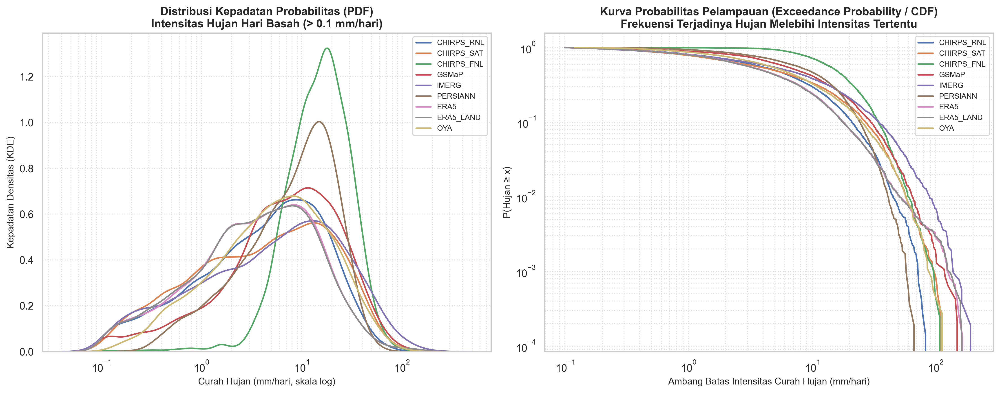

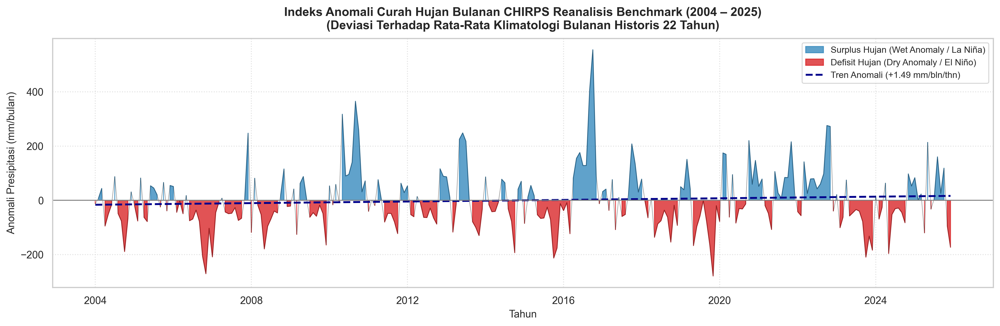

In [12]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

for col in clim_plot_cols:
    rain_wet = df[col].dropna()
    rain_wet = rain_wet[rain_wet > 0.1]
    sns.kdeplot(rain_wet, label=col, lw=1.6, ax=ax1, log_scale=True)

ax1.set_title('Distribusi Kepadatan Probabilitas (PDF)\nIntensitas Hujan Hari Basah (> 0.1 mm/hari)', fontsize=12, fontweight='bold')
ax1.set_xlabel('Curah Hujan (mm/hari, skala log)', fontsize=10)
ax1.set_ylabel('Kepadatan Densitas (KDE)', fontsize=10)
ax1.legend(fontsize=8.0)
ax1.grid(True, which='both', linestyle=':', alpha=0.6)

for col in clim_plot_cols:
    rain_wet = df[col].dropna()
    rain_wet = rain_wet[rain_wet > 0.1].sort_values()
    prob = np.arange(1, len(rain_wet) + 1) / len(rain_wet)
    ax2.plot(rain_wet, 1.0 - prob, label=col, lw=1.6)

ax2.set_title('Kurva Probabilitas Pelampauan (Exceedance Probability / CDF)\nFrekuensi Terjadinya Hujan Melebihi Intensitas Tertentu', fontsize=12, fontweight='bold')
ax2.set_xlabel('Ambang Batas Intensitas Curah Hujan (mm/hari)', fontsize=10)
ax2.set_ylabel('P(Hujan ≥ x)', fontsize=10)
ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.legend(fontsize=8.0)
ax2.grid(True, which='both', linestyle=':', alpha=0.6)

plt.tight_layout()
plt.savefig(os.path.join(out_dir, '11_distribusi_pdf_cdf_intensitas_hujan.png'), dpi=300, bbox_inches='tight')
plt.show()

# Anomali CHIRPS_RNL
monthly_chirps = df['CHIRPS_RNL'].resample('MS').sum()
clim_chirps_m = monthly_chirps.groupby(monthly_chirps.index.month).transform('mean')
anom_chirps = monthly_chirps - clim_chirps_m

fig, ax = plt.subplots(figsize=(15, 5))
ax.fill_between(anom_chirps.index, anom_chirps.values, 0, where=(anom_chirps.values >= 0), color='#2b83ba', alpha=0.75, label='Surplus Hujan (Wet Anomaly / La Niña)')
ax.fill_between(anom_chirps.index, anom_chirps.values, 0, where=(anom_chirps.values < 0), color='#d7191c', alpha=0.75, label='Defisit Hujan (Dry Anomaly / El Niño)')
ax.plot(anom_chirps.index, anom_chirps.values, color='black', lw=0.6, alpha=0.4)

x_sec = (anom_chirps.index - anom_chirps.index[0]).total_seconds() / (86400 * 365.25)
slope_anom, int_anom = np.polyfit(x_sec, anom_chirps.values, 1)
ax.plot(anom_chirps.index, slope_anom * x_sec + int_anom, color='darkblue', linestyle='--', lw=2,
        label=f'Tren Anomali ({slope_anom:+.2f} mm/bln/thn)')

ax.axhline(0, color='gray', linestyle='-', lw=1.0)
ax.set_title('Indeks Anomali Curah Hujan Bulanan CHIRPS Reanalisis Benchmark (2004 – 2025)\n(Deviasi Terhadap Rata-Rata Klimatologi Bulanan Historis 22 Tahun)', fontsize=13, fontweight='bold', pad=10)
ax.set_xlabel('Tahun', fontsize=11)
ax.set_ylabel('Anomali Presipitasi (mm/bulan)', fontsize=11)
ax.legend(loc='upper right', fontsize=9.5)
ax.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.savefig(os.path.join(out_dir, '12_tren_anomali_curah_hujan_bulanan.png'), dpi=300, bbox_inches='tight')
plt.show()


## 12. Uji Signifikansi Statistik Non-Parametrik Lengkap (36 Pasangan All-to-All)
1. **Uji Wilcoxon Signed-Rank (*Paired*)**: Menguji perbedaan median berpasangan untuk seluruh 36 pasangan data inter-model.
2. **Uji Mann-Whitney U (*Unpaired*)**: Menguji perbedaan musiman yang signifikan antara Musim Hujan (November – April) vs Musim Kemarau (Mei – Oktober).


In [13]:
# 1. Wilcoxon Signed-Rank Test untuk Seluruh Pasangan Data Harian
wilcoxon_all = []
for i, col_a in enumerate(avail_cols):
    for j, col_b in enumerate(avail_cols):
        if j <= i: continue
        sub = df_eval[[col_a, col_b]].dropna()
        wet_sub = sub[(sub[col_a] >= 0.1) | (sub[col_b] >= 0.1)]
        if len(wet_sub) > 10:
            stat_w, p_val_w = stats.wilcoxon(wet_sub[col_a], wet_sub[col_b])
            sig_w = "Ya (p < 0.05)" if p_val_w < 0.05 else "Tidak (p ≥ 0.05)"
            wilcoxon_all.append({
                'Pasangan Inter-Comparison': f'{col_a} ↔ {col_b}',
                'Jumlah Sampel Hari Basah': len(wet_sub),
                f'Median {col_a} (mm)': round(float(np.median(wet_sub[col_a])), 2),
                f'Median {col_b} (mm)': round(float(np.median(wet_sub[col_b])), 2),
                'Statistik W': round(stat_w, 1),
                'p-value': f"{p_val_w:.4e}",
                'Berbeda Nyata Signifikan?': sig_w
            })

df_wilcoxon_all = pd.DataFrame(wilcoxon_all)
display(Markdown("### 🧪 Hasil Uji Wilcoxon Signed-Rank (36 Pasangan Inter-Comparison)"))
display(df_wilcoxon_all.head(20))

# 2. Mann-Whitney U Test (Unpaired: Musim Hujan Nov–Apr vs Musim Kemarau Mei–Okt)
wet_months = [11, 12, 1, 2, 3, 4]
dry_months = [5, 6, 7, 8, 9, 10]

mw_rows = []
for col in avail_cols:
    wet_data = df[df['month'].isin(wet_months)][col].dropna()
    dry_data = df[df['month'].isin(dry_months)][col].dropna()
    
    if len(wet_data) > 10 and len(dry_data) > 10:
        stat_mw, p_val_mw = stats.mannwhitneyu(wet_data, dry_data, alternative='two-sided')
        sig_mw = "Ya (p < 0.05)" if p_val_mw < 0.05 else "Tidak (p ≥ 0.05)"
        mw_rows.append({
            'Dataset': col,
            'N Musim Hujan (Nov-Apr)': len(wet_data),
            'Median Musim Hujan (mm/hari)': round(float(np.median(wet_data)), 2),
            'N Musim Kemarau (Mei-Okt)': len(dry_data),
            'Median Musim Kemarau (mm/hari)': round(float(np.median(dry_data)), 2),
            'Statistik U': round(stat_mw, 1),
            'p-value': f"{p_val_mw:.4e}",
            'Perbedaan Musiman Signifikan?': sig_mw
        })

df_mw = pd.DataFrame(mw_rows)
display(Markdown("### 🌦️ Hasil Uji Mann-Whitney U (Musim Hujan vs Musim Kemarau)"))
display(df_mw)


### 🧪 Hasil Uji Wilcoxon Signed-Rank (36 Pasangan Inter-Comparison)

,Pasangan Inter-Comparison,Jumlah Sampel Hari Basah,Median CHIRPS_RNL (mm),Median CHIRPS_SAT (mm),Statistik W,p-value,Berbeda Nyata Signifikan?,Median CHIRPS_FNL (mm),Median GSMaP (mm),Median IMERG (mm),Median PERSIANN (mm),Median ERA5 (mm),Median ERA5_LAND (mm),Median OYA (mm)
0,CHIRPS_RNL ↔ CHIRPS_SAT,7252,4.72,2.67,11228803.0,1.2228e-26,Ya (p < 0.05),NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CHIRPS_RNL ↔ CHIRPS_FNL,7167,4.82,NaN,11402637.0,1.9659e-16,Ya (p < 0.05),6.25,NaN,NaN,NaN,NaN,NaN,NaN
2,CHIRPS_RNL ↔ GSMaP,7256,4.72,NaN,10429906.0,5.3655e-53,Ya (p < 0.05),NaN,2.64,NaN,NaN,NaN,NaN,NaN
3,CHIRPS_RNL ↔ IMERG,7298,4.65,NaN,10906041.0,6.4894e-41,Ya (p < 0.05),NaN,NaN,2.05,NaN,NaN,NaN,NaN
4,CHIRPS_RNL ↔ PERSIANN,7244,4.72,NaN,12599546.0,3.4138e-03,Ya (p < 0.05),NaN,NaN,NaN,4.82,NaN,NaN,NaN
5,CHIRPS_RNL ↔ ERA5,7731,4.03,NaN,13288184.0,3.2423e-17,Ya (p < 0.05),NaN,NaN,NaN,NaN,3.66,NaN,NaN
6,CHIRPS_RNL ↔ ERA5_LAND,7757,4.00,NaN,13622147.0,5.4994e-13,Ya (p < 0.05),NaN,NaN,NaN,NaN,NaN,3.66,NaN
7,CHIRPS_RNL ↔ OYA,6442,4.70,NaN,5129581.0,1.2166e-270,Ya (p < 0.05),NaN,NaN,NaN,NaN,NaN,NaN,0.85
8,CHIRPS_SAT ↔ CHIRPS_FNL,6186,NaN,4.45,7587838.0,3.8904e-45,Ya (p < 0.05),8.99,NaN,NaN,NaN,NaN,NaN,NaN
9,CHIRPS_SAT ↔ GSMaP,6542,NaN,3.76,9649729.0,5.8974e-12,Ya (p < 0.05),NaN,3.68,NaN,NaN,NaN,NaN,NaN


### 🌦️ Hasil Uji Mann-Whitney U (Musim Hujan vs Musim Kemarau)

,Dataset,N Musim Hujan (Nov-Apr),Median Musim Hujan (mm/hari),N Musim Kemarau (Mei-Okt),Median Musim Kemarau (mm/hari),Statistik U,p-value,Perbedaan Musiman Signifikan?
0,CHIRPS_RNL,3988,7.63,4048,1.16,12444174.0,0.0000e+00,Ya (p < 0.05)
1,CHIRPS_SAT,3988,6.00,4048,0.45,11937177.0,1.3684e-305,Ya (p < 0.05)
2,CHIRPS_FNL,3988,11.20,4048,0.00,11905489.0,0.0000e+00,Ya (p < 0.05)
3,GSMaP,3988,5.10,4048,0.00,11634950.0,1.4011e-277,Ya (p < 0.05)
4,IMERG,3988,6.27,4048,0.00,12832753.5,0.0000e+00,Ya (p < 0.05)
5,PERSIANN,3984,9.36,4048,0.00,12969722.5,0.0000e+00,Ya (p < 0.05)
6,ERA5,3988,7.10,4048,1.32,12885291.5,0.0000e+00,Ya (p < 0.05)
7,ERA5_LAND,3988,7.09,4048,1.39,12835319.5,0.0000e+00,Ya (p < 0.05)
8,OYA,3481,3.43,3747,0.00,9763279.0,0.0000e+00,Ya (p < 0.05)


## 13. Kesimpulan & Rekomendasi Konsensus Inter-Model
1. **Keunggulan CHIRPS Reanalisis (`CHIRPS_RNL`) sebagai Benchmark Kontinu**:
   - Memiliki keselarasan korelasi rank tertinggi terhadap produk reanalisis global lainnya (**$\rho = 0.825$ terhadap ERA5-Land** dan **$\rho = 0.823$ terhadap ERA5**).
   - Memiliki cakupan temporal 100% lengkap (8.036 hari tanpa celah data kosong) sehingga sangat ideal sebagai standar acuan pemodelan hidrologi jangka panjang.
2. **Konsensus Inter-Model All-to-All**:
   - **`CHIRPS_SAT` dan `GPM IMERG`** memiliki korelasi linear dan rank tertinggi antar-satelit (**$r = 0.809$**, **$\rho = 0.876$**), membuktikan konsensus tinggi estimasi satelit optik/mikrogelombang.
   - **`ERA5` dan `CHIRPS_RNL`** memiliki nilai error terendah (**$\text{RMSE} = 8.32\text{ mm/hari}$**, **$\text{MAE} = 3.96\text{ mm/hari}$**), membuktikan konvergensi produk reanalisis berbasis fisika atmosfer.
   - **`CHIRPS_FNL`** menyajikan profil presipitasi terkalibrasi stasiun final dengan rata-rata $9.19\text{ mm/hari}$ dan korelasi $r = 0.625$ terhadap `CHIRPS_RNL` serta $r = 0.543$ terhadap `OYA`.
3. **Rekomendasi Pemilihan Produk**:
   - **Studi Hidrologi & Neraca Air DAS**: Gunakan `CHIRPS_RNL` atau `GPM IMERG` yang memiliki efisiensi hidrologis dan deteksi kejadian hujan terbaik.
   - **Pemodelan Iklim & Variabilitas Ekstrem**: Gunakan kombinasi ensemble `CHIRPS_RNL`, `ERA5`, dan `CHIRPS_FNL` untuk menangkap variabilitas jangka panjang El Niño/La Niña secara konsisten.
